<h1><center>Yelp Explorartory Data Analysis</center></h1>

In [1]:
import numpy as np
import pandas as pd
import plotly
import cufflinks as cf
import seaborn as sns
plotly.tools.set_credentials_file(username='DesciuitV',api_key='Q1xpEcxmp80nvR9Cho16')
import plotly.plotly as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt
from plotly.offline import init_notebook_mode,iplot
import plotly.io as pio
from ipywidgets import interactive, HBox, VBox, widgets, interact

init_notebook_mode(connected=True)
#cf.set_config_file(theme='ggplot')
from notebook.services.config import ConfigManager
cm = ConfigManager()
cm.update('livereveal', {
        'width': 1024,
        'height': 768,
        'scroll': True,
})
%matplotlib inline

In [3]:
df1 = pd.read_csv("business.csv",dtype={'business_id': str})
df2 = pd.read_csv("review.csv",dtype={'business_id': str, 'review_id': str,'user_id':str})

C:\Users\MatthiasL\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning:

Columns (0,2) have mixed types. Specify dtype option on import or set low_memory=False.



In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192609 entries, 0 to 192608
Data columns (total 15 columns):
Unnamed: 0      192609 non-null int64
address         184927 non-null object
attributes      163773 non-null object
business_id     192609 non-null object
categories      192127 non-null object
city            192608 non-null object
hours           147779 non-null object
is_open         192609 non-null int64
latitude        192609 non-null float64
longitude       192609 non-null float64
name            192609 non-null object
postal_code     191950 non-null object
review_count    192609 non-null int64
stars           192609 non-null float64
state           192609 non-null object
dtypes: float64(3), int64(3), object(9)
memory usage: 22.0+ MB


In [5]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6685902 entries, 0 to 6685901
Data columns (total 10 columns):
Unnamed: 0     object
business_id    object
cool           object
date           object
funny          float64
review_id      object
stars          float64
text           object
useful         float64
user_id        object
dtypes: float64(3), object(7)
memory usage: 510.1+ MB


In [6]:
df1.isnull().sum()

Unnamed: 0          0
address          7682
attributes      28836
business_id         0
categories        482
city                1
hours           44830
is_open             0
latitude            0
longitude           0
name                0
postal_code       659
review_count        0
stars               0
state               0
dtype: int64

In [7]:
df2.isnull().sum()

Unnamed: 0     0
business_id    0
cool           0
date           2
funny          2
review_id      2
stars          2
text           4
useful         4
user_id        4
dtype: int64

In [8]:
df2.head()

,Unnamed: 0,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,0,ujmEBvifdJM6h6RLv4wQIg,0,2013-05-07 04:34:36,1.0,Q1sbwvVQXV2734tPgoKj4Q,1.0,Total bill for this horrible service? Over $8G...,6.0,hG7b0MtEbXx5QzbzE6C_VA
1,1,NZnhc2sEQy3RmzKTZnqtwQ,0,2017-01-14 21:30:33,0.0,GJXCdrto3ASJOqKeVWPi6Q,5.0,I *adore* Travis at the Hard Rock's new Kelly ...,0.0,yXQM5uF2jS6es16SJzNHfg
2,2,WTqjgwHlXbSFevF32_DJVw,0,2016-11-09 20:09:03,0.0,2TzJjDVDEuAW6MR5Vuc1ug,5.0,I have to say that this office really has it t...,3.0,n6-Gk65cPZL6Uz8qRm3NYw
3,3,ikCg8xy5JIg_NGPx-MSIDA,0,2018-01-09 20:56:38,0.0,yi0R0Ugj_xUx_Nek0-_Qig,5.0,Went in for a lunch. Steak sandwich was delici...,0.0,dacAIZ6fTM6mqwW5uxkskg
4,4,b1b1eb3uo-w561D0ZfCEiQ,0,2018-01-30 23:07:38,0.0,11a8sVPMUFtaC7_ABRkmtw,1.0,Today was my second out of three sessions I ha...,7.0,ssoyf2_x0EQMed6fgHeMyQ


In [9]:
df1.head()

,Unnamed: 0,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
0,0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,NaN,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ
1,1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMe...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported...",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON
2,2,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': ""u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC
3,3,"15655 W Roosevelt St, Ste 237",NaN,xvX2CttrVhyG2z1dFg_0xw,"Insurance, Financial Services",Goodyear,"{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",1,33.455613,-112.395596,Farmers Insurance - Paul Lorenz,85338,3,5.0,AZ
4,4,"4209 Stuart Andrew Blvd, Ste F","{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...",HhyxOkGAM07SRYtlQ4wMFQ,"Plumbing, Shopping, Local Services, Home Servi...",Charlotte,"{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",1,35.190012,-80.887223,Queen City Plumbing,28217,4,4.0,NC


In [10]:
df1[df1['postal_code'].isnull()].head()

,Unnamed: 0,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
155,155,NaN,NaN,xXdRivb3LjGCl8HiuUa22g,"Insurance, Financial Services",Madison,NaN,1,43.073052,-89.401230,QBE Insurance,NaN,4,1.0,WI
299,299,NaN,NaN,bsagBzOdt-JmeuSengyUWA,"Handyman, Professional Services, Electricians,...",Brampton,NaN,1,43.731548,-79.762418,All in One Home Renovations,NaN,3,1.0,ON
316,316,NaN,NaN,oUi5Dhv7_6OgHKAsZMyojQ,"Home Services, Home Cleaning",Las Vegas,NaN,1,36.169941,-115.139830,Coronado Trails Maids,NaN,6,2.0,NV
478,478,NaN,{'BusinessAcceptsCreditCards': 'True'},CeYOohT_QMhITFd1TZ7i-A,"Carpeting, Home Services",Las Vegas,NaN,1,36.175000,-115.136389,Palms Carpet Cleaning,NaN,11,1.0,NV
873,873,NaN,"{'BusinessParking': ""{'garage': False, 'street...",VVLGIq6ksrgGSfi7VBTmpg,"Restaurants, American (Traditional)",Las Vegas,NaN,1,36.102931,-115.176544,America Cafe,NaN,8,4.0,NV


In [11]:
df1.dropna(subset=['categories'],inplace=True)

In [12]:
print("There are",df1.categories.nunique(),'unique business categories!')

There are 93385 unique business categories!


In [13]:
df1['categories'].value_counts()[:30]

Restaurants, Pizza                           1042
Nail Salons, Beauty & Spas                   1031
Pizza, Restaurants                            993
Beauty & Spas, Nail Salons                    947
Food, Coffee & Tea                            888
Mexican, Restaurants                          885
Coffee & Tea, Food                            865
Restaurants, Mexican                          853
Chinese, Restaurants                          840
Hair Salons, Beauty & Spas                    831
Beauty & Spas, Hair Salons                    819
Restaurants, Chinese                          789
Automotive, Auto Repair                       585
Auto Repair, Automotive                       534
Food, Grocery                                 492
Grocery, Food                                 491
Restaurants, Italian                          474
Italian, Restaurants                          446
Banks & Credit Unions, Financial Services     439
Financial Services, Banks & Credit Unions     401


We see that there are alot of restaurants/food related categories. Let try to aggregate them into a more general category

In [14]:
cat = "Restaurants|Ice Cream & Frozen Yogurt|Food|Coffee & Tea|Desserts|Pizza|Bars|Fast Food|FastFood|Sandiwches|Bakeries|Delis|Breakfast|Pub|Bars|Cafe"
nocat = "Grocery|Spa|Nail Salons|Beauty & Spas|Barbers|Hair Salons|Tattoo|Hair|Nails|Auto|Automotive|Auto Repair|Car Rental|Car Dealers|Real Estate|Apartments|Home Services|Pest Control|Self StorageBanks|Credit Unions|Financial ServicesVeterinarians|Pets|Pet StoresHealth & Medical|Doctors|Health|DentistsLocal Services|Laundry|Libraries|Repair|Cinema|Arts|Public Services|Government|Professional|Religious Organizations|ChurchesProfessional ServicesShoppingActive Life|Yoga|Golf|Swimming Pools|Hiking|Amusement Parks|Gyms|Education|Mass Media|Radio Stations|Local Flavor|Guns|Tax|Magic|Boat|Tours|Watches|Bike"

df1.loc[(df1['categories'].str.contains(cat)) & (~df1['categories'].str.contains(nocat)),'categories'] = 'Restaurants/Food'

In [15]:
df1.loc[(df1['categories'].str.contains("Grocery")) & (df1['categories'].str.contains("Food")),'categories']  = 'Supermarket/ConvenienceStores'
df1.loc[df1['categories'].str.contains("Nail Salons|Beauty & Spas|Barbers|Hair Salons|Tattoo|Hair|Nails"),'categories'] = 'Beauty/Spa Services'
df1.loc[df1['categories'].str.contains("Auto|Automotive|Auto Repair|Car Rental|Car Dealers"),'categories'] = 'Car Services'
df1.loc[df1['categories'].str.contains("Real Estate|Apartments|Home Services|Pest Control|Self Storage"),'categories'] = 'Real Estate & Home Services'
df1.loc[df1['categories'].str.contains("Banks|Credit Unions|Financial Services"),'categories'] = 'Financial Services'
df1.loc[df1['categories'].str.contains("Veterinarians|Pets|Pet Stores"),'categories'] = 'Pet Stores/Services'
df1.loc[df1['categories'].str.contains("Hotels|Event|Travel"),'categories'] = 'Hotels & Event Planning'
df1.loc[df1['categories'].str.contains("Health & Medical|Doctors|Health|Dentists"),'categories'] = 'Health & Medical Services'
df1.loc[df1['categories'].str.contains("Local Services|Laundry|Libraries|Repair|Cinema|Arts|Public Services|Government|Professional|Religious Organizations|Churches"),'categories'] = 'Local/Government Services'
df1.loc[df1['categories'].str.contains("Professional Services"),'categories'] = 'Professional Services'
df1.loc[df1['categories'].str.contains("Shopping"),'categories'] = 'Shopping'
df1.loc[df1['categories'].str.contains("Active Life|Yoga|Golf|Swimming Pools|Hiking|Amusement Parks|Gyms"),'categories'] = 'Active Life'
df1.loc[df1['categories'].str.contains("Education"),'categories'] = 'Education'
df1.loc[df1['categories'].str.contains("Night Life|Karaoke|NightLife|Nightlife"),'categories'] = 'Night Life'
df1.loc[df1['categories'].str.contains("Mass Media|Radio Stations"),'categories'] = 'Mass Media/Radio Stations'
df1.loc[df1['categories'].str.contains("Local Flavor"),'categories'] = 'Local Flavor'

In [76]:
dfa = df1['categories'].value_counts()[:10].sort_values(ascending=True)
label = dfa.index
size = dfa.values

trace = go.Bar(x=size,y=label,marker=dict(color=size,colorscale='Jet',showscale=False,reversescale=True)
               ,text=size,textposition='auto',orientation='h')

data= [trace]
layout = go.Layout(title='Top 10 Categories in Yelp',yaxis=dict(title='Categories',automargin=True),
                  xaxis=dict(title="Number of Businesses"),showlegend=False)

fig=go.Figure(data=data,layout=layout)
pio.write_image(fig, 'fig1.svg')
plotly.offline.iplot(fig)

## From here onwards, we'll focus on the 'Restaurants' category

In [17]:
dfr = df1[df1.categories.str.contains('Restaurants/Food')]

In [18]:
dfr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68444 entries, 1 to 192603
Data columns (total 15 columns):
Unnamed: 0      68444 non-null int64
address         67713 non-null object
attributes      65567 non-null object
business_id     68444 non-null object
categories      68444 non-null object
city            68444 non-null object
hours           51066 non-null object
is_open         68444 non-null int64
latitude        68444 non-null float64
longitude       68444 non-null float64
name            68444 non-null object
postal_code     68242 non-null object
review_count    68444 non-null int64
stars           68444 non-null float64
state           68444 non-null object
dtypes: float64(3), int64(3), object(9)
memory usage: 8.4+ MB


In [19]:
#Checking for null values
dfr.isnull().sum()

Unnamed: 0          0
address           731
attributes       2877
business_id         0
categories          0
city                0
hours           17378
is_open             0
latitude            0
longitude           0
name                0
postal_code       202
review_count        0
stars               0
state               0
dtype: int64

In [20]:
dfr.head()

,Unnamed: 0,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
1,1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMe...",QXAEGFB4oINsVuTFxEYKFQ,Restaurants/Food,Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON
2,2,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': ""u'avera...",gnKjwL_1w79qoiV3IC_xQQ,Restaurants/Food,Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC
11,11,2450 E Indian School Rd,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...",1Dfx3zM-rW4n-31KeC8sJg,Restaurants/Food,Phoenix,"{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",1,33.495194,-112.028588,Taco Bell,85016,18,3.0,AZ
13,13,5981 Andrews Rd,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...",fweCYi8FmbJXHCqLnwuk8w,Restaurants/Food,Mentor-on-the-Lake,"{'Monday': '10:0-0:0', 'Tuesday': '10:0-0:0', ...",1,41.708520,-81.359556,Marco's Pizza,44060,16,4.0,OH
14,14,4145 Erie St,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...",-K4gAv8_vjx8-2BxkVeRkA,Restaurants/Food,Willoughby,"{'Tuesday': '11:0-17:0', 'Wednesday': '11:0-17...",1,41.639860,-81.406396,Baby Cakes,44094,7,3.0,OH


In [21]:
dfr = dfr.drop(['Unnamed: 0','address','attributes','hours'],axis=1)
dfr = dfr.dropna(subset=['postal_code'],axis=0)

In [22]:
dfr.isnull().sum()

business_id     0
categories      0
city            0
is_open         0
latitude        0
longitude       0
name            0
postal_code     0
review_count    0
stars           0
state           0
dtype: int64

### Next up, let's clean the data before visualizing it. Let's start with cities because that is what we're going to be plotting
The first city I'm starting with is Montreal because I saw that it was spelt incorrectly when visualizing the dataframe above

In [23]:
dfr.city=dfr.city.astype(str).str.upper()

In [24]:
dfr.loc[dfr['city'].str.contains('MONT')]['city'].unique()

array(['MONTRÃ©AL', 'MONTREAL', 'MONTREAL-NORD', 'MONTGOMERY', 'BELMONT',
       'MONTICELLO', 'OAKMONT', 'SAINT-BRUNO-DE-MONTARVILLE',
       'MONT-ROYAL', 'MONTÃ©AL', 'MONTROSE', 'TREMONT', 'MONTRÃ©AL-NORD',
       'OUTREMONT', 'ST-BRUNO-DE-MONTARVILLE', 'MONTREAL-OUEST',
       'MONT-SAINT-HILAIRE', 'MONT-SAINT-GRÃ©GOIRE', 'MONTRÃ©AL-OUEST',
       'VIMONT', 'MONT ST-HILAIRE', 'DORMONT', 'MONTREAL-EST', 'PIEDMONT',
       'COMMUNAUTÃ©-URBAINE-DE-MONTRÃ©AL', 'MONTREAL-WEST', 'MONTRÃ¨AL',
       'SAINTT-BRUNO-DE-MONTARVILLE', 'VILLE MONT-ROYAL',
       'SAINT-SAUVEUR-DES-MONTS', 'DEUX-MONTAGNES', 'MONTRÃ©AL-WEST',
       'MONTRAL', 'DEUX-MONTAGNES REGIONAL COUNTY MUNICIPALITY'],
      dtype=object)

In [25]:
dfr.loc[dfr['city'].str.contains('MONTRÃ|MONTRE|MONTÃ©AL')]['city'].unique()

array(['MONTRÃ©AL', 'MONTREAL', 'MONTREAL-NORD', 'MONTÃ©AL',
       'MONTRÃ©AL-NORD', 'MONTREAL-OUEST', 'MONTRÃ©AL-OUEST',
       'MONTREAL-EST', 'COMMUNAUTÃ©-URBAINE-DE-MONTRÃ©AL',
       'MONTREAL-WEST', 'MONTRÃ¨AL', 'MONTRÃ©AL-WEST'], dtype=object)

In [26]:
dfr.loc[dfr['city'].str.contains('MONTRÃ|MONTRE|MONTÃ©AL'),'city'] = 'MONTREAL'

In [27]:
dfr.loc[dfr['city'].str.contains('TOR')]['city'].unique()

array(['MENTOR-ON-THE-LAKE', 'TORONTO', 'MENTOR', 'DOWNTOWN TORONTO',
       'MENTOR ON THE LAKE', 'TORONTO SCARBOROUGH', 'TORNTO',
       'MENTOR ON THE', 'NORTH TORONTO'], dtype=object)

In [28]:
dfr.loc[dfr['city'].str.contains('TORO|TORN'),'city'] = 'TORONTO'

In [29]:
dfr.loc[dfr['city'].str.contains('MISS')]['city'].unique()

array(['MISSISSAUGA', 'MISSISAUGA', 'MISSISSUAGA'], dtype=object)

In [30]:
dfr.loc[dfr['city'].str.contains('MISSISSAUGA|MISSISAUGA|MISSISSUAGA'),'city'] = 'MISSISSAUGA'

In [31]:
dfr.loc[dfr['city'].str.contains('LAS')]['city'].unique()

array(['LAS VEGAS', 'NORTH LAS VEGAS', 'GLASSPORT', 'LASALLE', 'DALLAS',
       'N. LAS VEGAS', 'SOUTH LAS VEGAS', 'N LAS VEGAS', 'LAS  VEGAS',
       'LASVEGAS'], dtype=object)

In [32]:
dfr.loc[dfr['city'].str.contains('LAS V|LASV|LAS  VEGAS'),'city'] = 'LAS VEGAS'

In [33]:
dfr.loc[dfr['city'].str.contains('YORK')]['city'].unique()

array(['NORTH YORK', 'EAST YORK', 'YORK', 'NORTH  YORK',
       'YORK REGIONAL MUNICIPALITY', 'REGIONAL MUNICIPALITY OF YORK'],
      dtype=object)

In [34]:
dfr.loc[dfr['city'].str.contains('YORK'),'city'] = 'YORK'

In [35]:
dfr.loc[dfr['city'].str.contains('CALGARY')]['city'].unique()

array(['CALGARY', 'NORTHWEST CALGARY', 'SOUTHEAST CALGARY'], dtype=object)

In [36]:
dfr.loc[dfr['city'].str.contains('CALGARY'),'city'] = 'CALGARY'

In [37]:
dfr.groupby(['city'])['review_count'].sum().sort_values(ascending=False)[:15]

city
LAS VEGAS     1167757
PHOENIX        405999
TORONTO        393781
SCOTTSDALE     205130
CHARLOTTE      201775
PITTSBURGH     162036
MONTREAL       127053
TEMPE          116004
HENDERSON      109958
CHANDLER        87957
MESA            86661
CLEVELAND       81282
MADISON         69001
GILBERT         65770
CALGARY         63818
Name: review_count, dtype: int64

In [38]:
# Function to format numbers to have comma thousands seperator
def thousands_format(x):
    return list(map('{:,d}'.format,x))

In [39]:
dfr1 = dfr.groupby(['city'])['review_count'].sum().sort_values(ascending=False)[:15].sort_values(ascending=True)
label = dfr1.index
size = dfr1.values

trace = go.Bar(x=size,y=label,marker=dict(color=size,colorscale='Jet',showscale=False,reversescale=True)
               ,text=size,textposition='auto',orientation='h')

data= [trace]
layout = go.Layout(title='Total Number of Reviews In Each City',yaxis=dict(title='City',automargin=True),
                  xaxis=dict(title="Number of Reviews",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [40]:
t = dfr[dfr['city']=='TORONTO']
mt = dfr[dfr['city']=='MONTREAL']
lv = dfr[dfr['city']=='LAS VEGAS']
p = dfr[dfr['city']=='PHOENIX']

# TORONTO

In [41]:
dfr1 = t['stars'].value_counts()
label = dfr1.index
size = dfr1.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Viridis',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=size,textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution in Toronto',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [42]:
stars = sorted(t['stars'].unique())

In [43]:
mapbox_access_token = 'pk.eyJ1IjoiZGVzY2l1aXR2IiwiYSI6ImNqcnZ1OWZ6MjA1eDYzeXBpOG5sZWd1NGcifQ.GQV-bvZFT62xzUBu2d4s6g'
map_style = "mapbox://styles/desciuitv/cjrwd4gn215au1ftfaphiuhhl"

my_text=['Name:' + name +'<br>Stars:' + str(stars) +'<br>Number of Reviews:' + str(revs)
  for name, stars, revs in zip(list(t['name']), list(t['stars']),
                           list(t['review_count'])) ] 

data = [
    go.Scattermapbox(
        lat=t['latitude'],
        lon=t['longitude'],
        mode='markers',
        marker=dict(size=6, color='gold', opacity=.5),
        text=my_text
    )
]

layout = go.Layout(
    autosize=True,
    hovermode='closest',
    width=1050,
    height=750,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=70,
        center=dict(
            lat=43.6512775,
            lon=-79.38878,
        ),
        pitch=70,
        zoom=14,
        style=map_style,
    
    ),
)

fig = dict(data=data, layout=layout)

plotly.offline.iplot(fig)

In [46]:
mapbox_access_token = 'pk.eyJ1IjoiZGVzY2l1aXR2IiwiYSI6ImNqcnZ1OWZ6MjA1eDYzeXBpOG5sZWd1NGcifQ.GQV-bvZFT62xzUBu2d4s6g'
map_style = "mapbox://styles/desciuitv/cjrwd4gn215au1ftfaphiuhhl"
        
#make figure
steps=[]
figure = {'data':[],
         'layout':{},
         'frames':[]
         }

figure['layout']['autosize'] = True
figure['layout']['hovermode'] ='closest'
figure['layout']['width'] = 1050
figure['layout']['height'] = 750
figure['layout']['mapbox'] = {'accesstoken':mapbox_access_token,'bearing':0,'center':{'lat':43.671094,'lon':-79.3874455},
                             'pitch':60,'zoom':12,'style':map_style}

figure['layout']['sliders'] = {
    'args': ["transition", {
            'duration': 1000,
            'easing': 'cubic-in-out'
        }
    ],
    # cast it to string because javascript doesn't have separate interger/float datatypes. As such, we cast it as string in Python
    'initialValue': str(stars[0]),
    'plotlycommand': 'animate',
    'values':str(stars[0]),
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 1000, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'cubic-in-out'},'mode':'immediate'}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,       #determines which button is considered active
    'steps': [],
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Stars:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration':300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0
}

#
for star in stars:
    slider_step = {'args': [
            [str(star)],
            {'frame': {'duration': 1000, 'redraw': False},
             'mode': 'immediate',
           'transition': {'duration': 300}} 
        ],
         'label':str(star),'value':str(star),
         'method': 'animate'}
    
    sliders_dict['steps'].append(slider_step)
    

#make data
for star in stars[:1]:
    t_by_stars = t[t['stars']==star]
    data_dict = {
            'type':'scattermapbox',
            'lat': list(t_by_stars['latitude']),
            'lon': list(t_by_stars['longitude']),
            'mode':'markers',
            'marker':{'size':6,'color':'gold','opacity':0.5},
            'text':['Name:' + name + '<br>Number of Reviews:' + str(revs) 
             for name, revs in zip(list(t_by_stars['name']), list(t_by_stars['review_count']))] 
            }
    figure['data'].append(data_dict)

#make frames
frames=[]
for star in stars:

    #frame = {'data':[],'name':str(star)}
    t_by_stars = t[t['stars']==star]
    
    data_dict = {
        'type':'scattermapbox',
        'lat': list(t_by_stars['latitude']),
        'lon': list(t_by_stars['longitude']),
        'mode':'markers',
        'marker':{'size':6,'color':'gold','opacity':0.5},
        'text':['Name:' + name + '<br>Number of Reviews:' + str(revs) 
             for name, revs in zip(list(t_by_stars['name']), list(t_by_stars['review_count']))] 
        }
    frame = {'data':[data_dict],'name':str(star)}
    #frame['data'].append(data_dict)
    frames.append(frame)
    #figure['frames'].append(frame) <- avoid this cause we want the list to contain only a single trace.. this has all the trace across all stars

figure['frames'] = frames
figure['layout']['sliders']=[sliders_dict]

plotly.offline.iplot(figure)
#iplot(figure)

# MONTREAL

In [48]:
dfr1 = mt['stars'].value_counts()
label = dfr1.index
size = dfr1.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Viridis',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=size,textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution in Montreal',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [71]:
mapbox_access_token = 'pk.eyJ1IjoiZGVzY2l1aXR2IiwiYSI6ImNqcnZ1OWZ6MjA1eDYzeXBpOG5sZWd1NGcifQ.GQV-bvZFT62xzUBu2d4s6g'
map_style = "mapbox://styles/desciuitv/cjrwd4gn215au1ftfaphiuhhl"

my_text=['Name:' + name +'<br>Stars:' + str(stars) +'<br>Number of Reviews:' + str(revs)
  for name, stars, revs in zip(list(mt['name']), list(mt['stars']),
                           list(mt['review_count'])) ] 
data = [
    go.Scattermapbox(
        lat=mt['latitude'],
        lon=mt['longitude'],
        mode='markers',
        marker=dict(
            size=6,
            color='gold',
            opacity=.5,
        ),
        text=my_text
    )
]

layout = go.Layout(
    autosize=True,
    hovermode='closest',
    width=1050,
    height=750,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=45.489505,
            lon=-73.599207,
        ),
        pitch=60,
        zoom=12,
        style=map_style,
    
    ),
)

fig = dict(data=data, layout=layout)

plotly.offline.iplot(fig)

In [73]:
mapbox_access_token = 'pk.eyJ1IjoiZGVzY2l1aXR2IiwiYSI6ImNqcnZ1OWZ6MjA1eDYzeXBpOG5sZWd1NGcifQ.GQV-bvZFT62xzUBu2d4s6g'
map_style = "mapbox://styles/desciuitv/cjrwd4gn215au1ftfaphiuhhl"

stars = sorted(mt['stars'].unique())
#make figure
steps=[]
figure = {'data':[],
         'layout':{},
         'frames':[]
         }

figure['layout']['autosize'] = True
figure['layout']['hovermode'] ='closest'
figure['layout']['width'] = 1050
figure['layout']['height'] = 750
figure['layout']['mapbox'] = {'accesstoken':mapbox_access_token,'bearing':0,'center':{'lat':45.489505,'lon':-73.599207},
                             'pitch':60,'zoom':12,'style':map_style}

figure['layout']['sliders'] = {
    'args': ["transition", {
            'duration': 1000,
            'easing': 'cubic-in-out'
        }
    ],
    # cast it to string because javascript doesn't have separate interger/float datatypes. As such, we cast it as string in Python
    'initialValue': str(stars[0]),
    'plotlycommand': 'animate',
    'values':str(stars[0]),
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 1000, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'cubic-in-out'},'mode':'immediate'}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,       #determines which button is considered active
    'steps': [],
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Stars:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration':300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0
}

#
for star in stars:
    slider_step = {'args': [
            [str(star)],
            {'frame': {'duration': 1000, 'redraw': False},
             'mode': 'immediate',
           'transition': {'duration': 300}} 
        ],
         'label':str(star),'value':str(star),
         'method': 'animate'}
    
    sliders_dict['steps'].append(slider_step)
    

#make data
for star in stars[:1]:
    mt_by_stars = mt[mt['stars']==star]
    data_dict = {
            'type':'scattermapbox',
            'lat': list(mt_by_stars['latitude']),
            'lon': list(mt_by_stars['longitude']),
            'mode':'markers',
            'marker':{'size':6,'color':'gold','opacity':0.5},
            'text':['Name:' + name + '<br>Number of Reviews:' + str(revs) 
             for name, revs in zip(list(t_by_stars['name']), list(t_by_stars['review_count']))] 
            }
    figure['data'].append(data_dict)

    
#make frames
frames=[]
for star in stars:
    
    #frame = {'data':[],'name':str(star)}
    mt_by_stars = mt[mt['stars']==star]
    
    data_dict = {
        'type':'scattermapbox',
        'lat': list(mt_by_stars['latitude']),
        'lon': list(mt_by_stars['longitude']),
        'mode':'markers',
        'marker':{'size':6,'color':'gold','opacity':0.5},
        'text':['Name:' + name + '<br>Number of Reviews:' + str(revs) 
             for name, revs in zip(list(t_by_stars['name']), list(t_by_stars['review_count']))] 
    }
    frame = {'data':[data_dict],'name':str(star)}
    #frame['data'].append(data_dict)
    frames.append(frame)
    #figure['frames'].append(frame) <- avoid this cause we want the list to contain only a single trace.. this has all the trace across all stars

figure['frames'] = frames
figure['layout']['sliders']=[sliders_dict]

plotly.offline.iplot(figure)
#iplot(figure)

# LAS VEGAS

In [51]:
dfr1 = lv['stars'].value_counts()
label = dfr1.index
size = dfr1.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Viridis',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=size,textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution in Las Vegas',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [74]:
mapbox_access_token = 'pk.eyJ1IjoiZGVzY2l1aXR2IiwiYSI6ImNqcnZ1OWZ6MjA1eDYzeXBpOG5sZWd1NGcifQ.GQV-bvZFT62xzUBu2d4s6g'
map_style = "mapbox://styles/desciuitv/cjrwd4gn215au1ftfaphiuhhl"


my_text=['Name:' + name +'<br>Stars:' + str(stars) +'<br>Number of Reviews:' + str(revs)
  for name, stars, revs in zip(list(lv['name']), list(lv['stars']),
                           list(lv['review_count'])) ] 
data = [
    go.Scattermapbox(
        lat=lv['latitude'],
        lon=lv['longitude'],
        mode='markers',
        marker=dict(
            size=6,
            color='gold',
            opacity=.5,
        ),
        text=my_text,
    )
]

layout = go.Layout(
    autosize=True,
    hovermode='closest',
    width=1050,
    height=750,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=36.110926,
            lon=-115.173089,
        ),
        pitch=60,
        zoom=14,
        style=map_style,
    
    ),
)

fig = dict(data=data, layout=layout)

plotly.offline.iplot(fig)

In [76]:
mapbox_access_token = 'pk.eyJ1IjoiZGVzY2l1aXR2IiwiYSI6ImNqcnZ1OWZ6MjA1eDYzeXBpOG5sZWd1NGcifQ.GQV-bvZFT62xzUBu2d4s6g'
map_style = "mapbox://styles/desciuitv/cjrwd4gn215au1ftfaphiuhhl"

stars = sorted(lv['stars'].unique())
#make figure
steps=[]
figure = {'data':[],
         'layout':{},
         'frames':[]
         }

figure['layout']['autosize'] = True
figure['layout']['hovermode'] ='closest'
figure['layout']['width'] = 1050
figure['layout']['height'] = 750
figure['layout']['mapbox'] = {'accesstoken':mapbox_access_token,'bearing':0,'center':{'lat':36.110926,'lon':-115.173089},
                             'pitch':60,'zoom':11,'style':map_style}

figure['layout']['sliders'] = {
    'args': ["transition", {
            'duration': 1000,
            'easing': 'cubic-in-out'
        }
    ],
    # cast it to string because javascript doesn't have separate interger/float datatypes. As such, we cast it as string in Python
    'initialValue': str(stars[0]),
    'plotlycommand': 'animate',
    'values':str(stars[0]),
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 1000, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'cubic-in-out'},'mode':'immediate'}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,       #determines which button is considered active
    'steps': [],
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Stars:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration':200, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0
}

#
for star in stars:
    slider_step = {'args': [
            [str(star)],
            {'frame': {'duration': 1000, 'redraw': False},
             'mode': 'immediate',
           'transition': {'duration': 300}} 
        ],
         'label':str(star),'value':str(star),
         'method': 'animate'}
    
    sliders_dict['steps'].append(slider_step)

#make data
for star in stars[:1]:
    lv_by_stars = lv[lv['stars']==star]
    data_dict = {
            'type':'scattermapbox',
            'lat': list(lv_by_stars['latitude']),
            'lon': list(lv_by_stars['longitude']),
            'mode':'markers',
            'marker':{'size':6,'color':'gold','opacity':0.5},
            'text':['Name:' + name + '<br>Number of Reviews:' + str(revs) 
             for name, revs in zip(list(lv_by_stars['name']), list(lv_by_stars['review_count']))] 
            }
    figure['data'].append(data_dict)

#make frames
frames=[]
for star in stars:
    
    #frame = {'data':[],'name':str(star)}
    lv_by_stars = lv[lv['stars']==star]
    
    data_dict = {
        'type':'scattermapbox',
        'lat': list(lv_by_stars['latitude']),
        'lon': list(lv_by_stars['longitude']),
        'mode':'markers',
        'marker':{'size':6,'color':'gold','opacity':0.5},
        'text':['Name:' + name + '<br>Number of Reviews:' + str(revs) 
             for name, revs in zip(list(lv_by_stars['name']), list(lv_by_stars['review_count']))] 
        }
    frame = {'data':[data_dict],'name':str(star)}
    #frame['data'].append(data_dict)
    frames.append(frame)
    #figure['frames'].append(frame) <- avoid this cause we want the list to contain only a single trace.. this has all the trace across all stars

figure['frames'] = frames
figure['layout']['sliders']=[sliders_dict]

plotly.offline.iplot(figure)
#iplot(figure)

# Data Prep for Sentiment Analysis

In [48]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6685902 entries, 0 to 6685901
Data columns (total 10 columns):
Unnamed: 0     object
business_id    object
cool           object
date           object
funny          float64
review_id      object
stars          float64
text           object
useful         float64
user_id        object
dtypes: float64(3), object(7)
memory usage: 510.1+ MB


In [49]:
df2.drop(columns=['Unnamed: 0'],inplace=True)

# Since we're focused on restaurant reviews, we merge our main dataframe with the cleaned restaurant dataframe from above. We do a right join as we only want data from the restaurant dataframe

In [56]:
import re
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.cross_validation import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from tqdm import tqdm, tqdm_pandas
import warnings
warnings.filterwarnings("ignore")

C:\Users\MatthiasL\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [59]:
dfn = pd.merge(df2,df1[['business_id','name','city','state']], on='business_id',how='right')

In [50]:
dfm = pd.merge(df2,dfr[['business_id','name','city','state']], on='business_id',how='right')

In [77]:
dfm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4181838 entries, 0 to 4181838
Data columns (total 13 columns):
business_id    object
cool           object
date           object
funny          float64
review_id      object
stars          float64
text           object
useful         float64
user_id        object
name           object
city           object
state          object
text_length    int64
dtypes: float64(3), int64(1), object(9)
memory usage: 446.7+ MB


In [60]:
dfm.isnull().sum()

business_id    0
cool           1
date           1
funny          1
review_id      1
stars          1
text           1
useful         2
user_id        2
name           0
city           0
state          0
dtype: int64

### We see that we have null data and since we have over 4.5million observations, we can afford to drop a few null observations

In [51]:
dfm.dropna(inplace=True)

In [52]:
dfm.isnull().sum()

business_id    0
cool           0
date           0
funny          0
review_id      0
stars          0
text           0
useful         0
user_id        0
name           0
city           0
state          0
dtype: int64

In [60]:
#For restaurant reviews only
print("There are",format(dfm['business_id'].nunique(),',d'),"unique businesses")
print("There are a total of",format(dfm['stars'].count(),',d'),"restaurant reviews by", 
      (format (dfm['user_id'].nunique(),',d')),"unique users")

There are 68,241 unique businesses
There are a total of 4,181,838 restaurant reviews by 1,124,795 unique users


In [61]:
#For all reviews in the Yelp dataset
print("There are",format(dfn['business_id'].nunique(),',d'),"unique businesses")
print("There are a total of",format(dfn['stars'].count(),',d'),"restaurant reviews by", 
      (format (dfn['user_id'].nunique(),',d')),"unique users")

There are 192,127 unique businesses
There are a total of 6,683,763 restaurant reviews by 1,636,547 unique users


<h1><center>After merging <i>Business</i> and <i>Reviews</i> dataset...</center></h1>


<h3><center>There are <span style='color: #FF0000;'>192,127</span> unique businesses. <br/> We have <span style='color:  #3399ff;'>6,683,763</span> restaurant reviews by <span style='color:#248f24;'>1,636,547</span> unique users!</center></h3>


In [64]:
dp = dfm['stars'].value_counts()
label = dp.index
size = dp.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Portland',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=thousands_format(size),textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution for Restaurants Reviews',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

## Next, let's see the length of the reviews over the different star ratings

In [56]:
dfm['text_length'] = dfm['text'].apply(len)

In [57]:
dfm.groupby('stars')['text_length'].size()

stars
1.0     490061
2.0     382284
3.0     551892
4.0    1087238
5.0    1670363
Name: text_length, dtype: int64

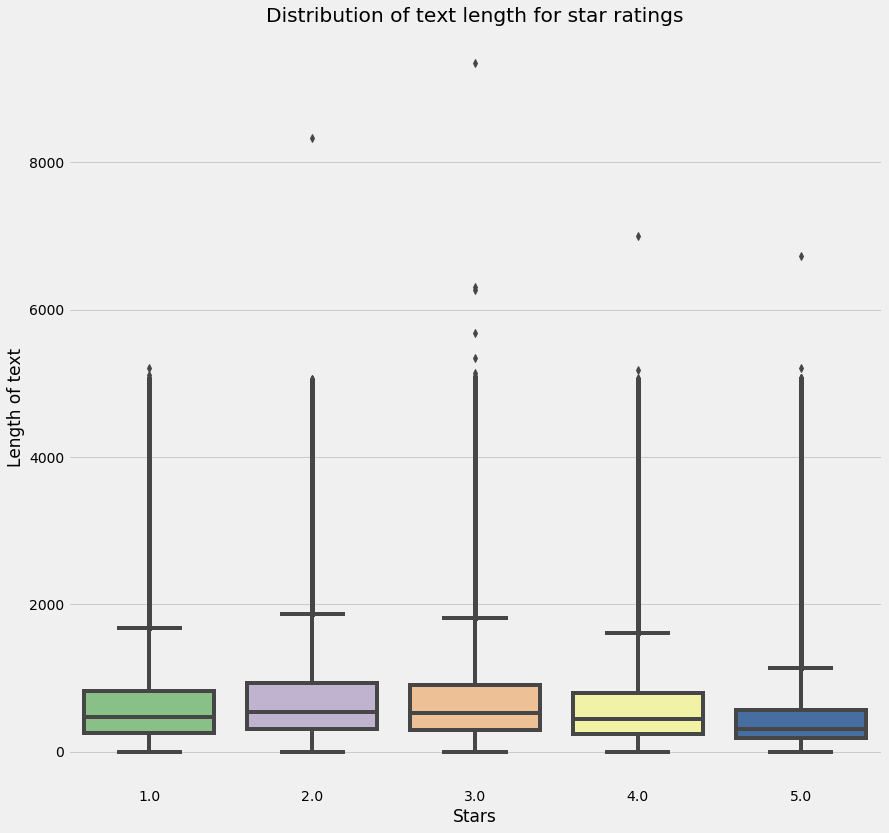

In [58]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(13,13))
sns.boxplot(x='stars',y='text_length',data=dfm,palette='Accent')
#sns.boxplot(y='stars',x='text_length',data=dfm,palette='Accent')
plt.ylabel("Length of text", fontsize=17)
plt.xlabel("Stars",fontsize=17)
plt.title("Distribution of text length for star ratings")

plt.show()

In [68]:
def percentile(n):
    def percentile_(x):
        return np.percentile(x, n)
    percentile_.__name__ = 'percentile_%s' % n
    return percentile_

In [69]:
dfmmm = dfm.groupby('stars')['text_length'] \
       .agg([('Mean',np.mean),('Median',np.median),('25th Percentile',lambda x: np.percentile(x,q = 25))]) \
       .reset_index()
print(dfmmm)

   stars        Mean  Median  25th Percentile
0    1.0  652.903126     468              263
1    2.0  720.128044     541              305
2    3.0  691.948124     526              294
3    4.0  608.316645     445              245
4    5.0  463.338658     317              186



## The average text length for NEGATIVE reviews are longer than POSITIVE reviews!


# Creating 2 classes for negative and positive reviews

* Reviews that are 1 and 2 stars will be encoded as **NEGATIVE review, 0**
* Reviews that are 4 and 5 stars will be encoded as **POSITIVE review, 1**

In [70]:
dfm['target'] = dfm['stars'].apply(lambda x: 0 if x < 3 else 1 if (x>3) else None)

In [71]:
dp = dfm['target'].value_counts()
label = dp.index
size = dp.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Portland',showscale=False,reversescale=True,line=dict(color='black',width=3))
               ,text=thousands_format(size),textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Positive and Negative Review Distribution',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Reviews',automargin=True),
                   xaxis=dict(title="Negative/Positive",automargin=True,dtick=1),
                   showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [72]:
dfm=dfm.dropna() # drop all the null values in target that was not captured above (reviews with 3 stars)
dfm.isnull().sum() #check for null values

business_id    0
cool           0
date           0
funny          0
review_id      0
stars          0
text           0
useful         0
user_id        0
name           0
city           0
state          0
text_length    0
target         0
dtype: int64

In [73]:
dfm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3629946 entries, 0 to 4181837
Data columns (total 14 columns):
business_id    object
cool           object
date           object
funny          float64
review_id      object
stars          float64
text           object
useful         float64
user_id        object
name           object
city           object
state          object
text_length    int64
target         float64
dtypes: float64(4), int64(1), object(9)
memory usage: 415.4+ MB


### As we can see from the bar plot above, we have an unbalanced dataset with about 3.1:1 positive to negative ratio. To avoid biasnesses in our analysis, I decided to randomly sample exactly 965,204 reviews from the positive class to achieve equal class balance

In [165]:
#q=r['stars'].value_counts()/3012329

In [166]:
#3012329/(3012329+965204)*100

In [167]:
#r = dfm[dfm['target']==1] #prep 4+5 star ratings for under sampling 

In [177]:
dfc = dfm[['text','target']]
dfc = dfc.groupby('target').apply(lambda s: s.sample(len(dfm[dfm['target']==0]),random_state=951306)).reset_index(drop=True)
dfc.target = dfc.target.astype(int)
dfc.columns = ['reviews','target']
print('Now we have a total of',(format(len(dfc),',d')),"reviews that are distributed equally between 2 classes.")

Now we have a total of 1,744,690 reviews that are distributed equally between 2 classes.


In [178]:
dfc.target.value_counts()

1    872345
0    872345
Name: target, dtype: int64

I realized one important issue before we can start using the data. Specifically, negation words are truncated for example, from can't to can. This may affect our sentiment analysis. As such, we'll convert negation words into their proper form

In [74]:
tok = WordPunctTokenizer()

#negation & appostrophe dictionary
n_dict = {"isn't":"is not", "aren't":"are not", "wasn't":"was not", "weren't":"were not",
          "haven't":"have not","hasn't":"has not","hadn't":"had not","won't":"will not",
          "wouldn't":"would not", "don't":"do not", "doesn't":"does not","didn't":"did not",
          "can't":"can not","couldn't":"could not","shouldn't":"should not","mightn't":"might not",
          "mustn't":"must not","shan't":"shall not",
          "isnt":"is not", "arent":"are not", "wasnt":"was not", "werent":"were not","havent":"have not",
          "hasnt":"has not","hadnt":"had not","wont":"will not","wouldnt":"would not", "dont":"do not", "doesnt":"does not",
          "didnt":"did not", "cant":"can not","couldnt":"could not","shouldnt":"should not","mightnt":"might not",
          "mustnt":"must not","shant" : "shall not" ,
          "he'd" : "he would","he'll" : "he will", "he's" : "he is", "i'd" : "i would", "i'd" : "i had", "i'll" : "i will",
          "i'm" : "i am", "im" : "i am","it's" : "it is", "it'll":"it will", "i've" : "i have", "ive" : "i have", "let's" : "let us",
          "she'd" : "she would", "she'll" : "she will", "she's" : "she is", "that's" : "that is", "there's" : "there is", 
          "they'd" : "they would", "they'll" : "they will", "they're" : "they are", "they've" : "they have", "we'd" : "we would", "we're" : "we are",
          "that's" : "that is", "there's" : "there is", "they'd" : "they would", "they'll" : "they will", "they're" : "they are",
          "they've" : "they have", "we'd" : "we would", "we're" : "we are", "you'd" : "you would", "you'll" : "you will", 
          "you're" : "you are", "you've" : "you have", "'re": " are",
          "youre" : "you are", "youve" : "you have","theyre" : "they are", "thats" : "that is", "shes" : "she is"}

n_pattern = re.compile(r'\b(' + '|'.join(n_dict.keys()) + r')\b')

#pronouns_dict = {"i've: i have", "i'm":"i am", "we've: we have","they've: they have"}
#pronouns_pattern = re.compile(r'\b(' + '|'.join(pronouns_dict.keys()) + r')\b')

def clean_preprocess(text):
    """
    Given a string of text, the function:
    1. Remove all punctuations and numbers and converts texts to lower case
    2. Handles negation words defined above.
    3. Tokenies words that are of more than length 1
    """
    lower = re.sub(r'[^a-zA-Z\s\']', "", text).lower()
    lower_neg_handled = n_pattern.sub(lambda x: n_dict[x.group()], lower)
    letters_only = re.sub(r'[^a-zA-Z\s]', "", lower_neg_handled)
    words = [i for i  in tok.tokenize(letters_only) if len(i) > 1] ##parallelize this? 
    return (' '.join(words))

def tokenize(df):
    """Get tokens for each review in df. tqdm implemented to show the progress bar"""
    tokens = []
    for i in tqdm(range(len(df.values))):
        tokens.append(clean_preprocess(df.values[i]))
    return tokens


#-----------ALTERNATE USE------------#
stemmer = SnowballStemmer("english") 
stemmer2 = WordNetLemmatizer()

def preprocess(text):
    """
    Given a string of text, the function:
    1. Remove all punctuation
    2. Converts texts to lowercase
    3. Remove all stopwords
    4. Returns a list of lemmatized words (using Snowball Stemmer)
    """
    tokens = [i for i in re.sub(r'[^a-zA-Z\s]', "", text).lower().split() if i not in stopwords.words('english')]
    #' '.join([stemmer.stem(t) for t in tokens])
    
    return [stemmer2.lemmatize(t) for t in tokens]

In [180]:
cleaned = tokenize(dfc.reviews)

100%|██████████████████████████████████████████████████████████████████████| 1744690/1744690 [06:47<00:00, 4277.90it/s]


In [181]:
dfd = pd.DataFrame(cleaned,columns=['reviews'])
dfd['target'] = dfc.target
dfd.to_csv("resampled_clean_reviews.csv",encoding='utf-8')

In [182]:
#let's check for any problems with our new dataset
df2=pd.read_csv("resampled_clean_reviews.csv",index_col=0)
df2.head()

,reviews,target
0,was not really very impressed bajio is not bad...,0
1,ordered pizza last night at pm at my husband w...,0
2,seriously terrible my office all ordered from ...,0
3,honestly do not understand what the hype is do...,0
4,quick recap bad customer service do not order ...,0


In [183]:
df2.isnull().sum()

reviews    239
target       0
dtype: int64

### It turns out that after cleaning, we have 258 null values. Perhaps maybe there is something wrong with our cleaning method.. but lets check it out to see what the problem really is

In [184]:
q=df2.loc[df2.reviews.isnull()].index #getting list of index where there is null values
dfc.iloc[q,:]

,reviews,target
21699,æœ€æ‚ªã�®ã‚µãƒ¼ãƒ“ã‚¹ã€�\r\n\r\n ãƒ¬ã‚·ãƒ¼ãƒˆã...,0
23451,è£¡é�¢çš„å·¥ä½œäººå“¡ï¼Œè·Ÿçƒ�é¾œä¸€æ¨£ï¼�æ…¢å...,0
28838,..,0
34766,æ—¥æœ¬é£Ÿã�¨ã�¯æ€�ã�ˆã�ªã�„åº—æ§‹ã�ˆã€‚\r\nãƒ©...,0
52180,E,0
70945,ãƒ©ãƒ¼ãƒ¡ãƒ³ã�¯æ™®é€šã�«ç¾Žå‘³ã�—ã�‹ã�£ã�Ÿã�§ã...,0
71336,ä½ ä»¬å®¶çš„ç”œå“�å¤ªéš¾å�ƒäº†å�§ï¼Œéƒ½ä¸�çŸ¥é...,0
73696,è¿™æ˜¯å�¬å¾®ä¿¡ç¾¤ç»„çš„æœ‹å�‹ä»‹ç»�çš„ä¸€ä¸ªé...,0
92118,V,0
92612,æ³¡éºµéƒ½æ¯”é€™å€‹å¥½å�ƒï¼Œå®Œå…¨æ²’æœ‰æ‹‰éºµç...,0


### It seems like the problem is that those reviews are written in a language other than english. We're going to remove them

In [185]:
df2.dropna(inplace=True)
df2.isnull().sum()

reviews    0
target     0
dtype: int64

In [186]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1744451 entries, 0 to 1744689
Data columns (total 2 columns):
reviews    object
target     int64
dtypes: int64(1), object(1)
memory usage: 39.9+ MB


In [111]:
dp = df2['target'].value_counts()
label = dp.index
size = dp.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Portland',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=thousands_format(size),textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution for Restaurants Reviews',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [112]:
df2.to_csv("resampled_clean_reviews.csv",encoding='utf-8')

## Now that we have a dataset that is processed and clean, we are ready to perform our review prediction based on different classification algorithm

In [75]:
dfn.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6683766 entries, 0 to 6683765
Data columns (total 12 columns):
business_id    object
cool           object
date           object
funny          float64
review_id      object
stars          float64
text           object
useful         float64
user_id        object
name           object
city           object
state          object
dtypes: float64(3), object(9)
memory usage: 662.9+ MB


In [76]:
dfn.isnull().sum()

business_id    0
cool           3
date           3
funny          3
review_id      3
stars          3
text           5
useful         5
user_id        5
name           0
city           3
state          0
dtype: int64

In [64]:
dfn.dropna(inplace=True)

In [65]:
print("There are",format(dfn['business_id'].nunique(),',d'),"unique businesses")
print("There are a total of",format(dfn['stars'].count(),',d')," reviews by", 
      (format (dfn['user_id'].nunique(),',d')),"unique users")

There are 192,123 unique businesses
There are a total of 6,683,756  reviews by 1,636,546 unique users


In [79]:
dp = dfn['stars'].value_counts()
label = dp.index
size = dp.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Portland',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=thousands_format(size),textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution for all Reviews',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [66]:
dfn['text_length'] = dfn['text'].apply(len)

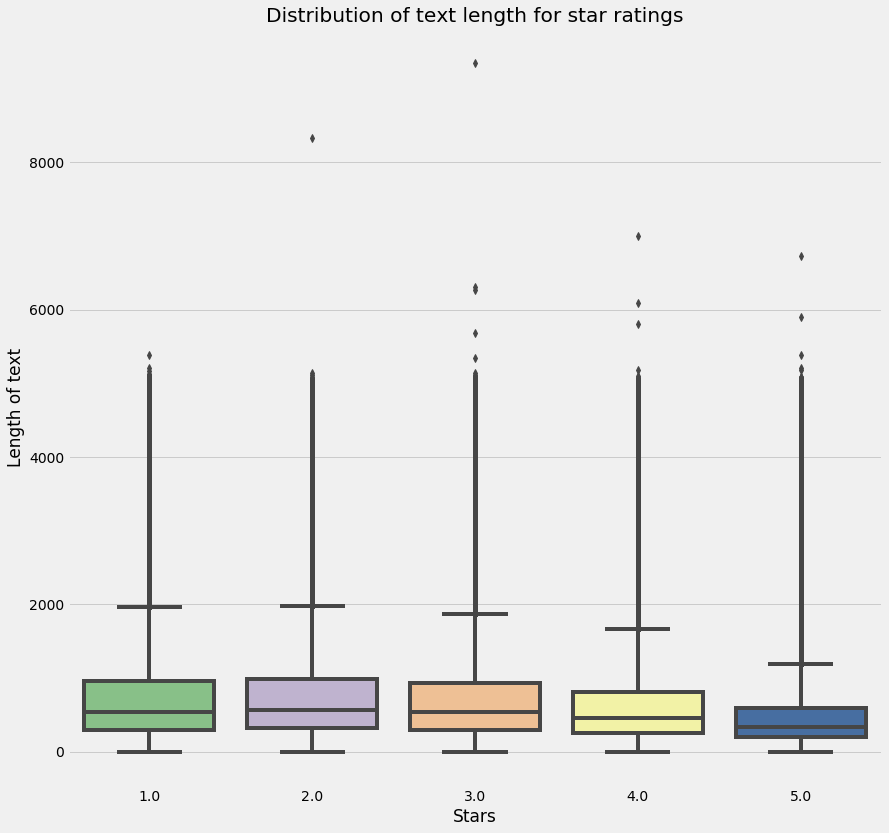

In [67]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(13,13))
sns.boxplot(x='stars',y='text_length',data=dfn,palette='Accent')
#sns.boxplot(y='stars',x='text_length',data=dfm,palette='Accent')
plt.ylabel("Length of text", fontsize=17)
plt.xlabel("Stars",fontsize=17)
plt.title("Distribution of text length for star ratings")
plt.show()

In [82]:
def percentile(n):
    def percentile_(x):
        return np.percentile(x, n)
    percentile_.__name__ = 'percentile_%s' % n
    return percentile_

In [83]:
dfnn = dfn.groupby('stars')['text_length'] \
       .agg([('Mean',np.mean),('Median',np.median),('25th Percentile',lambda x: np.percentile(x,q = 25))]) \
       .reset_index()
print(dfnn)

   stars        Mean  Median  25th Percentile
0    1.0  762.697060     542              300
1    2.0  765.770812     573              322
2    3.0  713.849289     542              303
3    4.0  627.339078     461              254
4    5.0  483.292364     341              200



## The average text length for NEGATIVE reviews are longer than POSITIVE reviews!


# Creating 2 classes for negative and positive reviews

* Reviews that are 1 and 2 stars will be encoded as **NEGATIVE review, 0**
* Reviews that are 4 and 5 stars will be encoded as **POSITIVE review, 1**

In [84]:
dfn['target'] = dfn['stars'].apply(lambda x: 0 if x < 3 else 1 if (x>3) else None)

In [85]:
dp = dfn['target'].value_counts()
label = dp.index
size = dp.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Portland',showscale=False,reversescale=True,line=dict(color='black',width=3))
               ,text=thousands_format(size),textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Positive and Negative Review Distribution',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Reviews',automargin=True),
                   xaxis=dict(title="Negative/Positive",automargin=True,dtick=1),
                   showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [86]:
dfn=dfn.dropna() # drop all the null values in target that was not captured above (reviews with 3 stars)
dfn.isnull().sum() #check for null values

business_id    0
cool           0
date           0
funny          0
review_id      0
stars          0
text           0
useful         0
user_id        0
name           0
city           0
state          0
text_length    0
target         0
dtype: int64

In [87]:
dfz = dfn[['text','target']]
dfz = dfz.groupby('target').apply(lambda s: s.sample(len(dfn[dfn['target']==0]),random_state=951306)).reset_index(drop=True)
dfz.target = dfz.target.astype(int)
dfz.columns = ['reviews','target']
print('Now we have a total of',(format(len(dfz),',d')),"reviews that are distributed equally between 2 classes.")

Now we have a total of 3,086,008 reviews that are distributed equally between 2 classes.


In [88]:
dfz.target.value_counts()

1    1543004
0    1543004
Name: target, dtype: int64

In [89]:
cleanedaf = tokenize(dfz.reviews)

100%|██████████████████████████████████████████████████████████████████████| 3086008/3086008 [06:20<00:00, 8103.52it/s]


In [90]:
dfy = pd.DataFrame(cleanedaf,columns=['reviews'])
dfy['target'] = dfz.target
dfy.to_csv("allcat_clean_reviews.csv",encoding='utf-8')

In [91]:
#let's check for any problems with our new dataset
df4=pd.read_csv("allcat_clean_reviews.csv",index_col=0)
df4.head()

,reviews,target
0,the rooms are big but the hotel is not good as...,0
1,second time with ocp saturday night pm not bus...,0
2,food is still great since they remodeled but t...,0
3,dirty location and very high prices but they d...,0
4,so first the off stood outside for mins to try...,0


In [92]:
df4.isnull().sum()

reviews    345
target       0
dtype: int64

### It turns out that after cleaning, we have 345 observations with null values. Perhaps maybe there is something wrong with our cleaning method.. but lets check it out to see what the problem really is

In [300]:
dfz.iloc[155463,:]

reviews    N O P E
target           0
Name: 155463, dtype: object

In [93]:
q=df4.loc[df4.reviews.isnull()].index #getting list of index where there is null values
dfz.iloc[q,:]

,reviews,target
4489,ä¸�å‘³é�Žã�Žï¼�\r\néººã€�ã‚¹ãƒ¼ãƒ—ã€�å…·æ��ã€�...,0
13789,éš¾å�ƒï¼Œæˆ‘çœŸæ˜¯ä¸§å°½å¤©è‰¯äº†æ�¥å�ƒè¿™å®¶ã...,0
18787,ç­‰äº†å››å��åˆ†é’Ÿï¼Œå�ªä¸Šäº†ä¸€ä¸ªæ‰‹æ’•åŒ…è...,0
36900,?,0
41368,ä»·æ ¼æ¶¨çš„é£žå¿«ï¼Œæ¯�æ ·è�œéƒ½ä¸Šæ¶¨äº†1.00...,0
44600,......,0
51187,é£Ÿç‰©ä¸�æ–°é²œï¼Œå­˜æ”¾æ—¶é—´é•¿ï¼Œå�£æ„Ÿå°±æ...,0
59859,æ–™ç�†ã�®ç¨®é¡žã�¯å¤šã�„ã�‘ã�©ã€�æ–™ç�†ã��ã‚Œã...,0
60346,å¤ªéš¾å�ƒäº†ï¼Œç‰›è‚‰é�¢çš„è‚‰å�—é‡Œé�¢æ˜¯å‡‰ç...,0
66966,æœ�å‹™æ…‹åº¦å¤ªå·®äº†ï¼Œçˆ›çˆ†äº†ã€‚\r\næˆ‘å€‘...,0


### It seems like the problem is that those reviews are written in a language other than english. We're going to remove them

In [94]:
df4.dropna(inplace=True)
df4.isnull().sum()

reviews    0
target     0
dtype: int64

In [95]:
dp = df4['target'].value_counts()
label = dp.index
size = dp.values

trace = go.Bar(x=label,y=size,marker=dict(color=size,colorscale='Portland',showscale=False,reversescale=True,line=dict(color='rgb(8,48,107)',width=2))
               ,text=thousands_format(size),textposition='auto',orientation='v',opacity=0.7)

data= [trace]
layout = go.Layout(title='Star Rating Distribution for Restaurants Reviews',font=dict(size=16,color='black'),
                   yaxis=dict(title='# of Businesses',automargin=True),
                   xaxis=dict(title="Star Ratings",automargin=True),showlegend=False,width=1050,height=700)

fig=go.Figure(data=data,layout=layout)
plotly.offline.iplot(fig)

In [96]:
#df4.to_csv("allcat_clean_reviews.csv",encoding='utf-8')